# Diamond Project

 ![Imagen](../img/diamante-brillante.gif)

## Importaciones de librerias y exploración


In [1]:

%matplotlib inline

import numpy as np
import pandas as pd

import seaborn as sns
# El mantra de las visualizaciones
from matplotlib import pyplot as plt
%matplotlib inline
%config Inlinebackend.figure_format = 'retina'

import seaborn as sns
sns.set_context('poster')
sns.set(rc={'figure.figsize': (16., 9.)})
sns.set_style('whitegrid')

import plotly.express as px
import plotly.graph_objects as go

import sys
sys.path.append('../tools')
import manipuladora as mp

from sklearn.model_selection import train_test_split as tts
from sklearn import metrics

from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import Ridge, Lasso
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR

## Importo el dataset limpio del cuaderno 01

In [2]:
ntrain = pd.read_csv('../data/new_train.csv')
ntest = pd.read_csv('../data/test.csv')

In [3]:
ntrain.sample()

,id,carat,cut,color,clarity,depth,table,x,y,z,price
9568,10719,0.31,Premium,G,VS2,61.5,59.0,4.33,4.35,2.67,544


In [4]:
ntrain.shape

(36328, 11)

In [5]:
ntrain.describe()

,id,carat,depth,table,x,y,z,price
count,36328.000000,36328.000000,36328.000000,36328.000000,36328.000000,36328.000000,36328.000000,36328.000000
mean,20258.215426,0.734867,61.799851,57.231392,5.603940,5.609196,3.464669,3475.116522
std,11667.069215,0.394538,1.060943,2.000603,1.019084,1.013591,0.629938,3376.316653
min,0.000000,0.200000,59.100000,52.000000,3.730000,3.680000,1.410000,335.000000
25%,10176.750000,0.380000,61.100000,56.000000,4.660000,4.670000,2.870000,905.750000
50%,20256.500000,0.700000,61.900000,57.000000,5.600000,5.590000,3.460000,2196.000000
75%,30327.500000,1.020000,62.500000,59.000000,6.460000,6.460000,4.000000,4925.000000
max,40453.000000,1.970000,64.500000,63.400000,8.110000,8.210000,5.060000,18806.000000


 ![Imagen](../img/escala-colores-fancy.png)

 ![Imagen](../img/escala-gia-claridad-diamantes-1.jpg)

In [6]:
cambia_color = {'G':4, 'H':5, 'F':3, 'J':7, 'E':2, 'I':6, 'D':1}
cambia_clarity = {'VVS2':3, 'VS2':5, 'VS1':4, 'SI2':7, 'SI1':6, 'VVS1':2, 'IF':1, 'I1':8}
cambia_cut = {"Ideal":1, "Premium":2,"Very Good":3,"Good":4, "Fair":5}

In [7]:
fig = px.scatter_matrix( ntrain, dimensions=['price','carat','x','y','z'],color="clarity",width=1000, height=800) 
fig.show()

In [8]:
X, y, X_train, X_test, y_train, y_test = mp.magia(ntrain, ntest)

In [9]:
fig = px.scatter_matrix( ntrain, dimensions=['price','carat','x','y','z'],color="clarity",width=1000, height=800) 
fig.show()

In [10]:
print(len(X), len(y), len(X_train), len(y_train), len(X_test), len(y_test))

36328 36328 29062 29062 7266 7266


<AxesSubplot:>

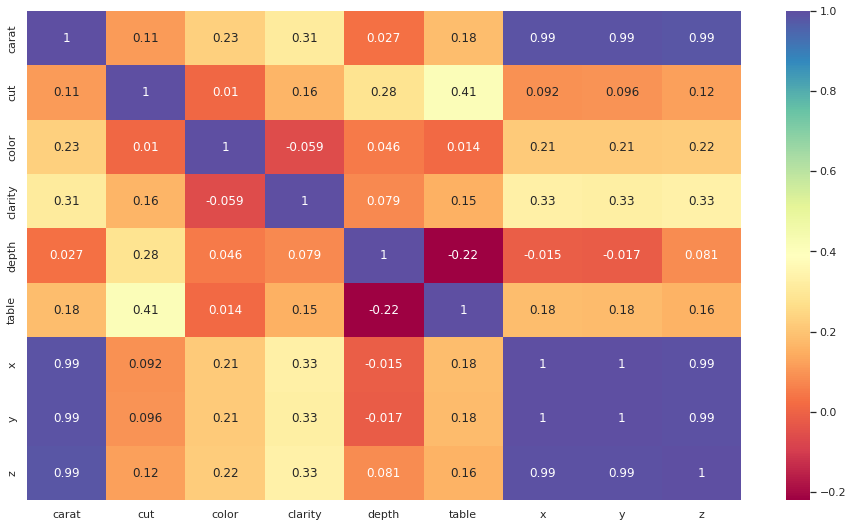

In [11]:
sns.heatmap(X.corr(),cmap="Spectral", annot= True)

In [12]:
X.sample()

,carat,cut,color,clarity,depth,table,x,y,z
18342,1.51,2,3,6,62.3,61.0,7.29,7.22,4.52


In [13]:
y.sample()

18882    8176
Name: price, dtype: int64

## preparo el test

In [14]:
ntest.sample()

,id,carat,cut,color,clarity,depth,table,x,y,z
3156,3156,0.31,2,5,6,61.0,61.0,4.39,4.33,2.66


In [15]:
ntrain.sample()

,id,carat,cut,color,clarity,depth,table,x,y,z,price
7642,8568,0.52,1,4,4,61.2,56.0,5.19,5.22,3.18,1662


In [16]:
ntest = ntest.drop(['id'], axis=1)

In [17]:
ntest.shape

(13485, 9)

## Entreno varios modelos a ciegas por ver que funciona kaggle

In [18]:
#X_train, X_test, y_train, y_test = tts(X,y, test_size=0.2)

In [19]:
models={
    'linear': LinearRegression(),
    'ridge': Ridge(),
    'lasso': Lasso(),
    'sgd': SGDRegressor(),
    'knn': KNeighborsRegressor(),
    'grad': GradientBoostingRegressor(),
    'svm': SVR()
}

In [20]:
for name, model in models.items():
    print("ENTRENANDO: ", name)
    model.fit(X_train, y_train)

ENTRENANDO:  linear
ENTRENANDO:  ridge
ENTRENANDO:  lasso
ENTRENANDO:  sgd


/home/fer/miniconda3/envs/minimal_ds/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:1503: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



ENTRENANDO:  knn
ENTRENANDO:  grad
ENTRENANDO:  svm


In [21]:
#Podemos seguir el mismo proceso para realizar predicciones de cada algoritmo y sacar métricas
for name, model in models.items():
    y_pred = model.predict(X_test)
    print(f"------{name}------")
    print('MAE - ', metrics.mean_absolute_error(y_test, y_pred))
    print('MSE - ', metrics.mean_squared_error(y_test, y_pred))
    print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('R2 - ', metrics.r2_score(y_test, y_pred))

------linear------
MAE -  707.7558791680036
MSE -  1053094.2192546132
RMSE -  1026.2037903138992
R2 -  0.9067334492680763
------ridge------
MAE -  708.2684945529821
MSE -  1053871.6699794803
RMSE -  1026.5825198100151
R2 -  0.9066645948900476
------lasso------
MAE -  709.2717585088567
MSE -  1059161.664853882
RMSE -  1029.1558020309083
R2 -  0.9061960902051827
------sgd------
MAE -  2673904.239107559
MSE -  11175397772420.861
RMSE -  3342962.4246199448
R2 -  -989740.2636341858
------knn------
MAE -  401.3361959812827
MSE -  507978.36441508395
RMSE -  712.7260093577923
R2 -  0.9550112525268888
------grad------
MAE -  262.03876492624715
MSE -  204733.16074684286
RMSE -  452.4744862938051
R2 -  0.9818679512486377
------svm------
MAE -  2373.275746058536
MSE -  12637452.983780654
RMSE -  3554.919546738105
R2 -  -0.11922715772605397


En esta ocasion considero el mejor el grad, voy ha hacer una submision con el por el vacile, pero creo que se purede seguir rascando de los datos. 

In [22]:
grad = GradientBoostingRegressor()
grad

GradientBoostingRegressor()

Lo entreno con todos mis valores

In [23]:
grad.fit(X, y)

GradientBoostingRegressor()

In [24]:
y_pred_grad = grad.predict(ntest)

In [25]:
y_pred_grad

array([3498.81764528, 2919.97034044, 4025.6237695 , ..., 7635.49502441,
        590.46781833, 1043.31561517])

In [26]:
len(y_pred_grad)

13485

Guardo la submission

In [27]:
sub_1 = pd.DataFrame(y_pred_grad)
sub_1 = sub_1.reset_index()
sub_1.columns = ['id', 'price']
sub_1.to_csv('../data/sub_1_n.csv', index = False)

Hago el test con el modelo entrenado 

In [28]:
ggy_pred = grad.predict(X_test)
print(f"-------grad------")
print('MAE - ', metrics.mean_absolute_error(y_test, ggy_pred))
print('MSE - ', metrics.mean_squared_error(y_test, ggy_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, ggy_pred)))
print('R2 - ', metrics.r2_score(y_test, ggy_pred))

-------grad------
MAE -  259.7609360893197
MSE -  199456.45165498304
RMSE -  446.60547651700716
R2 -  0.9823352792874924


In [29]:
eje_x = list(range(len(y_test)))
error = list(zip(eje_x, y_test, (ggy_pred)))
df = pd.DataFrame(error, columns= ['eje_x', 'y_test', 'ggy_pred'])
fig = px.line(df, x=eje_x, y=["y_test",'ggy_pred'])
fig.show()

In [30]:
help(GradientBoostingRegressor())

Help on GradientBoostingRegressor in module sklearn.ensemble._gb object:

class GradientBoostingRegressor(sklearn.base.RegressorMixin, BaseGradientBoosting)
 |  GradientBoostingRegressor(*, loss='squared_error', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, init=None, random_state=None, max_features=None, alpha=0.9, verbose=0, max_leaf_nodes=None, warm_start=False, validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)
 |  
 |  Gradient Boosting for regression.
 |  
 |  GB builds an additive model in a forward stage-wise fashion;
 |  it allows for the optimization of arbitrary differentiable loss functions.
 |  In each stage a regression tree is fit on the negative gradient of the
 |  given loss function.
 |  
 |  Read more in the :ref:`User Guide <gradient_boosting>`.
 |  
 |  Parameters
 |  ----------
 |  loss : {'squared_e


### vamos a ver si quitando todas  las columna colineales va mejor


In [31]:
X2 = ntrain.drop(['id','z','x', 'price'], axis=1)

In [32]:
X2.head()

,carat,cut,color,clarity,depth,table,y
0,1.14,1,4,3,61.0,56.0,6.76
1,0.76,1,5,5,62.7,57.0,5.82
2,0.84,1,4,4,61.4,56.0,6.15
3,1.55,1,5,4,62.0,57.0,7.43
4,0.30,1,4,7,61.9,57.0,4.31


In [33]:
X_train2, X_test2, y_train2, y_test2 = tts(X2,y, test_size=0.2)

In [34]:
models={
    'linear': LinearRegression(),
    'ridge': Ridge(),
    'lasso': Lasso(),
    'sgd': SGDRegressor(),
    'knn': KNeighborsRegressor(),
    'grad': GradientBoostingRegressor(),
}

In [35]:
for name, model in models.items():
    print("ENTRENANDO: ", name)
    model.fit(X_train2, y_train2)

ENTRENANDO:  linear
ENTRENANDO:  ridge
ENTRENANDO:  lasso
ENTRENANDO:  sgd
ENTRENANDO:  knn
ENTRENANDO:  grad


In [36]:
for name, model in models.items():
    y_pred2 = model.predict(X_test2)
    print(f"------{name}------")
    print('MAE -  ', metrics.mean_absolute_error(y_test2, y_pred2))
    print('MSE -  ', metrics.mean_squared_error(y_test2, y_pred2))
    print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test2, y_pred2)))
    print('R2 -   ', metrics.r2_score(y_test2, y_pred2))

------linear------
MAE -   718.2200033008774
MSE -   1125000.715595059
RMSE -  1060.6605091145136
R2 -    0.9012974395448201
------ridge------
MAE -   718.6646457971743
MSE -   1124686.2995819133
RMSE -  1060.512281674245
R2 -    0.9013250250077584
------lasso------
MAE -   719.509497179558
MSE -   1124458.3557099013
RMSE -  1060.404807472081
R2 -    0.9013450237895331
------sgd------
MAE -   23535394.205413878
MSE -   859311899067624.2
RMSE -  29314022.226020508
R2 -    -75392204.08203398
------knn------
MAE -   508.6671896504267
MSE -   811632.5653784751
RMSE -  900.9065242179541
R2 -    0.92879096764904
------grad------
MAE -   273.15111218089606
MSE -   234631.77745259888
RMSE -  484.38804429155647
R2 -    0.9794144511397294


mejora algo el grad


Lo entreno con todos mis datos

In [37]:
grad2 = GradientBoostingRegressor()
grad2

GradientBoostingRegressor()

In [38]:
grad2.fit(X2, y)

GradientBoostingRegressor()

Preparo el test dos dropeando columnas que no necesito en la prediccion y predigo

In [39]:
ntest2 = ntest.drop(['z','x'], axis=1)

In [40]:
y_pred_grad2 = grad2.predict(ntest2)

In [41]:
y_pred_grad2

array([3433.27665322, 2920.84062596, 3977.11396325, ..., 7856.29455831,
        560.53362029, 1014.25053431])

In [42]:
len(y_pred_grad2)

13485

Guardo la nuaeva submission

In [43]:
sub_1 = pd.DataFrame(y_pred_grad2)
sub_1 = sub_1.reset_index()
sub_1.columns = ['id', 'price']
sub_1.to_csv('../data/sub_2_n.csv', index = False)

In [44]:
gy_pred = grad2.predict(X_test2)
print(f"-------grad2------")
print('MAE - ', metrics.mean_absolute_error(y_test2, gy_pred))
print('MSE - ', metrics.mean_squared_error(y_test2, gy_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test2, gy_pred)))
print('R2 - ', metrics.r2_score(y_test2, gy_pred))

-------grad2------
MAE -  271.58179133120586
MSE -  228206.39085001766
RMSE -  477.7095256010892
R2 -  0.9799781859896701


In [45]:
eje_x = list(range(len(y_test)))
error = list(zip(eje_x, y_test, (gy_pred)))
df = pd.DataFrame(error, columns= ['eje_x', 'y_test', 'gy_pred'])
fig = px.line(df, x=eje_x, y=["y_test",'gy_pred'])
fig.show()

## mas modelos arbolitos y bosques 

In [46]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [47]:
models_green={
    'tree': DecisionTreeRegressor(),
    'forest': RandomForestRegressor(),
}

In [48]:
for name, model in models_green.items():
    print("ENTRENANDO: ", name)
    model.fit(X_train, y_train)

ENTRENANDO:  tree
ENTRENANDO:  forest


In [49]:
for name, model in models_green.items():
    y_pred = model.predict(X_test)
    print(f"------{name}------")
    print('MAE - ', metrics.mean_absolute_error(y_test, y_pred))
    print('MSE - ', metrics.mean_squared_error(y_test, y_pred))
    print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('R2 - ', metrics.r2_score(y_test, y_pred))

------tree------
MAE -  294.8702862647949
MSE -  321268.2572598404
RMSE -  566.8053080730988
R2 -  0.9715471021809521
------forest------
MAE -  221.4806047463944
MSE -  171476.64656217163
RMSE -  414.09738777511217
R2 -  0.9848132910963552


El forest parece dara un buen resultado. vamos a entrenarlo con todo

In [50]:
ntest.sample()

,carat,cut,color,clarity,depth,table,x,y,z
5743,0.31,1,3,5,61.6,56.0,4.39,4.35,2.69


In [51]:
forest = RandomForestRegressor()
forest

RandomForestRegressor()

Lo entreno con todos mis valores

In [52]:
forest.fit(X, y)

RandomForestRegressor()

In [53]:
y_pred_forest = forest.predict(ntest)

In [54]:
y_pred_forest

array([3557.01, 3214.  , 3959.47, ..., 8542.83,  602.09, 1080.86])

In [55]:
len(y_pred_forest)

13485

In [56]:
sub_3 = pd.DataFrame(y_pred_forest)
sub_3 = sub_3.reset_index()
sub_3.columns = ['id', 'price']
sub_3.to_csv('../data/sub_3_n.csv', index = False)

In [57]:
fy_pred = forest.predict(X_test)
print(f"-------forest------")
print('MAE - ', metrics.mean_absolute_error(y_test, fy_pred))
print('MSE - ', metrics.mean_squared_error(y_test, fy_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('R2 - ', metrics.r2_score(y_test, fy_pred))

-------forest------
MAE -  80.18917484238396
MSE -  23002.83370343414
RMSE -  414.09738777511217
R2 -  0.997962770170652


In [58]:
eje_x = list(range(len(y_test)))
error = list(zip(eje_x, y_test, (fy_pred)))
df = pd.DataFrame(error, columns= ['eje_x', 'y_test', 'fy_pred'])
fig = px.line(df, x=eje_x, y=["y_test",'fy_pred'])
fig.show()

In [59]:
# De momento el mejor es el ramdom forest.  va mos a ver si normalizando ... o con todos los datos originales. 


## mas modelos desde desceso de gradientes vitaminado a una red neuronal que no converge

In [60]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import RidgeCV
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor

In [61]:
models_green={
    'gradient': GradientBoostingRegressor(),
    'RidgeCV':RidgeCV(),
    'linear': LinearSVR(),
    'MLPR': MLPRegressor()
}

In [62]:
for name, model in models_green.items():
    print("ENTRENANDO: ", name)
    model.fit(X_train, y_train)

ENTRENANDO:  gradient
ENTRENANDO:  RidgeCV
ENTRENANDO:  linear
ENTRENANDO:  MLPR


/home/fer/miniconda3/envs/minimal_ds/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [63]:
for name, model in models_green.items():
    ny_pred = model.predict(X_test)
    print(f"------{name}------")
    print('MAE - ', metrics.mean_absolute_error(y_test, ny_pred))
    print('MSE - ', metrics.mean_squared_error(y_test, ny_pred))
    print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, ny_pred)))
    print('R2 - ', metrics.r2_score(y_test, ny_pred))

------gradient------
MAE -  262.03876492624744
MSE -  204733.16074684315
RMSE -  452.47448629380546
R2 -  0.9818679512486377
------RidgeCV------
MAE -  708.2684945305414
MSE -  1053871.6699820277
RMSE -  1026.582519811256
R2 -  0.906664594889822
------linear------
MAE -  887.9876104024617
MSE -  2406359.352613677
RMSE -  1551.2444528873186
R2 -  0.7868824721128586
------MLPR------
MAE -  540.1426122963525
MSE -  636970.0221864498
RMSE -  798.1040171471698
R2 -  0.943587196850234


In [64]:
gradient = GradientBoostingRegressor()
gradient

GradientBoostingRegressor()

Lo entreno con todos mis valores

In [65]:
gradient.fit(X, y)

GradientBoostingRegressor()

In [66]:
y_pred_gradient = gradient.predict(ntest)

In [67]:
y_pred_gradient

array([3498.81764528, 2919.97034044, 4025.6237695 , ..., 7635.49502441,
        590.46781833, 1043.31561517])

In [68]:
len(y_pred_gradient)

13485

In [69]:
sub_4 = pd.DataFrame(y_pred_gradient)
sub_4 = sub_4.reset_index()
sub_4.columns = ['id', 'price']
sub_4.to_csv('../data/sub_4_n.csv', index = False)

In [70]:
nny_pred = gradient.predict(X_test)
print(f"-------gradiente------")
print('MAE - ', metrics.mean_absolute_error(y_test, nny_pred))
print('MSE - ', metrics.mean_squared_error(y_test, nny_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, nny_pred)))
print('R2 - ', metrics.r2_score(y_test, nny_pred))

-------gradiente------
MAE -  259.7609360893205
MSE -  199456.45165498357
RMSE -  446.60547651700773
R2 -  0.9823352792874924


In [71]:
eje_x = list(range(len(y_test)))
error = list(zip(eje_x, y_test, (nny_pred)))
df = pd.DataFrame(error, columns= ['eje_x', 'y_test', 'nny_pred'])
fig = px.line(df, x=eje_x, y=["y_test",'nny_pred'])
fig.show()

## Mi ultimo cartucho XGBoost

In [72]:
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score, KFold

In [73]:
xgbr = xgb.XGBRegressor(verbosity=0) 
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

xgbr.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=0)

In [74]:
xgbr

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=0)

In [75]:
bby_pred = xgbr.predict(X_test)
print(f"-------grad------")
print('MAE - ', metrics.mean_absolute_error(y_test, bby_pred))
print('MSE - ', metrics.mean_squared_error(y_test, bby_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, bby_pred)))
print('R2 - ', metrics.r2_score(y_test, bby_pred))

-------grad------
MAE -  224.64771359583054
MSE -  171615.73725283064
RMSE -  414.26529815183727
R2 -  0.9848009726269158


In [76]:
xgbr = xgb.XGBRegressor(verbosity=0) 
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)



XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=None, importance_type='gain',
             interaction_constraints=None, learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None,
             monotone_constraints=None, n_estimators=100, n_jobs=1,
             nthread=None, num_parallel_tree=None, objective='reg:linear',
             predictor=None, random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, seed=None, silent=None, subsample=1,
             tree_method=None, ...)

Lo entreno con todos mis valores

In [77]:
xgbr.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=0)

In [78]:
y_pred_xgbr = xgbr.predict(ntest)

In [79]:
y_pred_xgbr

array([3786.4514, 2842.908 , 3766.7373, ..., 7868.7617,  551.0091,
       1126.3865], dtype=float32)

In [80]:
len(y_pred_xgbr)

13485

In [81]:
sub_5 = pd.DataFrame(y_pred_xgbr)
sub_5 = sub_5.reset_index()
sub_5.columns = ['id', 'price']
sub_5.to_csv('../data/sub_5_n.csv', index = False)

In [82]:
xgbry_pred = xgbr.predict(X_test)
print(f"-------gradiente------")
print('MAE - ', metrics.mean_absolute_error(y_test, xgbry_pred))
print('MSE - ', metrics.mean_squared_error(y_test, xgbry_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test, xgbry_pred)))
print('R2 - ', metrics.r2_score(y_test, nny_pred))

-------gradiente------
MAE -  170.97661104840154
MSE -  83632.26105953641
RMSE -  289.19242911863444
R2 -  0.9823352792874924


In [83]:
eje_x = list(range(len(y_test)))
error = list(zip(eje_x, y_test, (xgbry_pred)))
df = pd.DataFrame(error, columns= ['eje_x', 'y_test', 'xgbry_pred'])
fig = px.line(df, x=eje_x, y=["y_test",'xgbry_pred'])
fig.show()

# Entreno el bosque quitando algunos colineales

<AxesSubplot:>

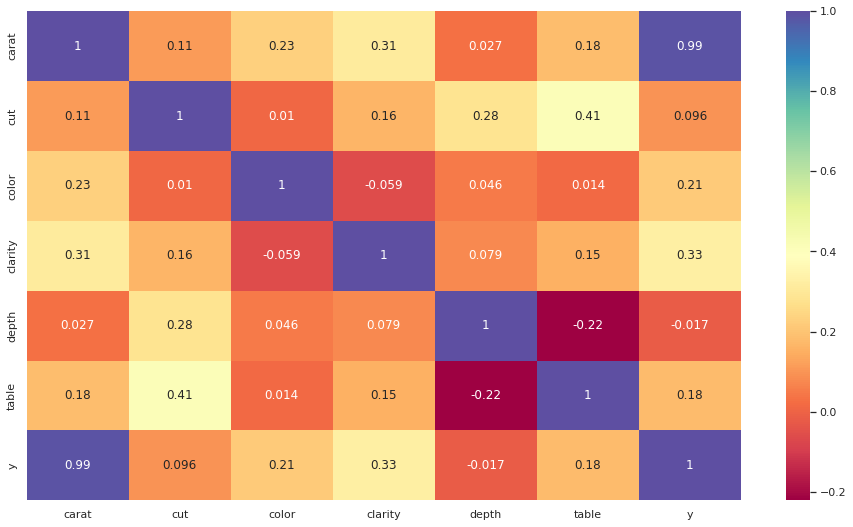

In [84]:
sns.heatmap(X2.corr(),cmap="Spectral", annot= True)

In [85]:
#X_train2, X_test2, y_train2, y_test2 = tts(X2,y, test_size=0.2)

In [86]:
forest = RandomForestRegressor()
forest

RandomForestRegressor()

Lo entreno con todos mis valores

In [87]:
forest.fit(X2, y)

RandomForestRegressor()

In [88]:
y_pred_forest2 = forest.predict(ntest2)

In [89]:
y_pred_forest2

array([3433.67, 3132.1 , 3809.16, ..., 8699.38,  590.58, 1047.57])

In [90]:
len(y_pred_forest2)

13485

In [91]:
sub_6 = pd.DataFrame(y_pred_forest2)
sub_6 = sub_6.reset_index()
sub_6.columns = ['id', 'price']
sub_6.to_csv('../data/sub_6_n.csv', index = False)

In [92]:
fy_pred = forest.predict(X_test2)
print(f"-------forest------")
print('MAE - ', metrics.mean_absolute_error(y_test2, fy_pred))
print('MSE - ', metrics.mean_squared_error(y_test2, fy_pred))
print('RMSE - ', np.sqrt(metrics.mean_squared_error(y_test2, fy_pred)))
print('R2 - ', metrics.r2_score(y_test2, fy_pred))

-------forest------
MAE -  87.33247817951845
MSE -  26683.06259970337
RMSE -  163.34951055850573
R2 -  0.9976589467341063


In [93]:
eje_x = list(range(len(y_test2)))
error = list(zip(eje_x, y_test2, (fy_pred)))
df = pd.DataFrame(error, columns= ['eje_x', 'y_test', 'fy_pred'])
fig = px.line(df, x=eje_x, y=["y_test",'fy_pred'])
fig.show()

# Limpio mas las colineales

In [94]:
X3 = ntrain.drop(['id','z','x','y', 'price'], axis=1)

In [95]:
X3.head()

,carat,cut,color,clarity,depth,table
0,1.14,1,4,3,61.0,56.0
1,0.76,1,5,5,62.7,57.0
2,0.84,1,4,4,61.4,56.0
3,1.55,1,5,4,62.0,57.0
4,0.30,1,4,7,61.9,57.0


<AxesSubplot:>

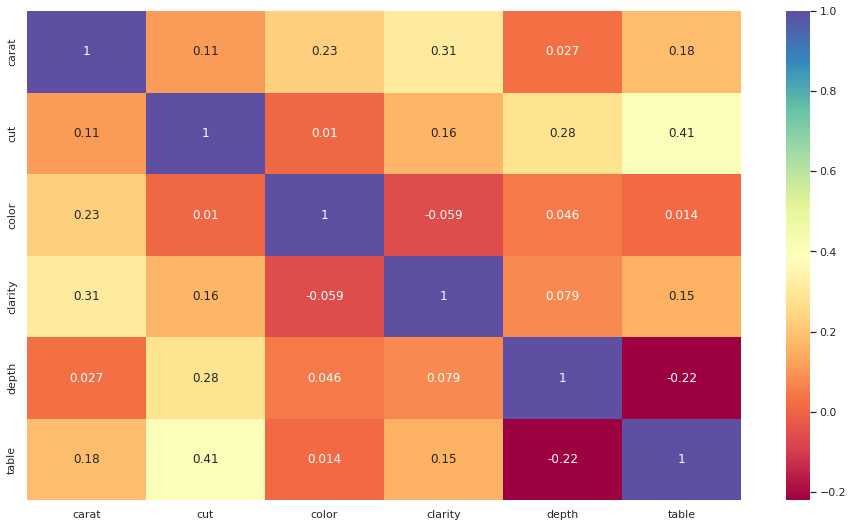

In [96]:
sns.heatmap(X3.corr(),cmap="Spectral", annot= True)

In [97]:
X_train3, X_test3, y_train3, y_test3 = tts(X3,y, test_size=0.2)

In [98]:
from sklearn.preprocessing import StandardScaler

In [99]:
scaler = StandardScaler()
scaler.fit(X_train3)
X_train3 = scaler.transform(X_train3)
X_test3 = scaler.transform(X_test3)

In [100]:
results = []

for depth in range(1,21):
    model = DecisionTreeRegressor(max_depth=depth)
    model.fit(X_train3,y_train3)
    
    result = {
        "model": model,
        "depth": depth,
        "train_error":np.sqrt(metrics.mean_squared_error(y_train3,model.predict(X_train3))),
        "test_error": np.sqrt(metrics.mean_squared_error(y_test3,model.predict(X_test3)))
    }
    results.append(result)


In [101]:
df = pd.DataFrame(results)

In [102]:
display(df)

,model,depth,train_error,test_error
0,DecisionTreeRegressor(max_depth=1),1,2012.131806,2005.852243
1,DecisionTreeRegressor(max_depth=2),2,1435.304779,1458.087153
2,DecisionTreeRegressor(max_depth=3),3,1150.633762,1159.163237
3,DecisionTreeRegressor(max_depth=4),4,943.314760,938.713484
4,DecisionTreeRegressor(max_depth=5),5,809.129743,822.476974
5,DecisionTreeRegressor(max_depth=6),6,683.224356,703.842808
6,DecisionTreeRegressor(max_depth=7),7,583.832523,619.985716
7,DecisionTreeRegressor(max_depth=8),8,510.470490,568.992837
8,DecisionTreeRegressor(max_depth=9),9,449.748748,533.453655
9,DecisionTreeRegressor(max_depth=10),10,398.519759,516.371130


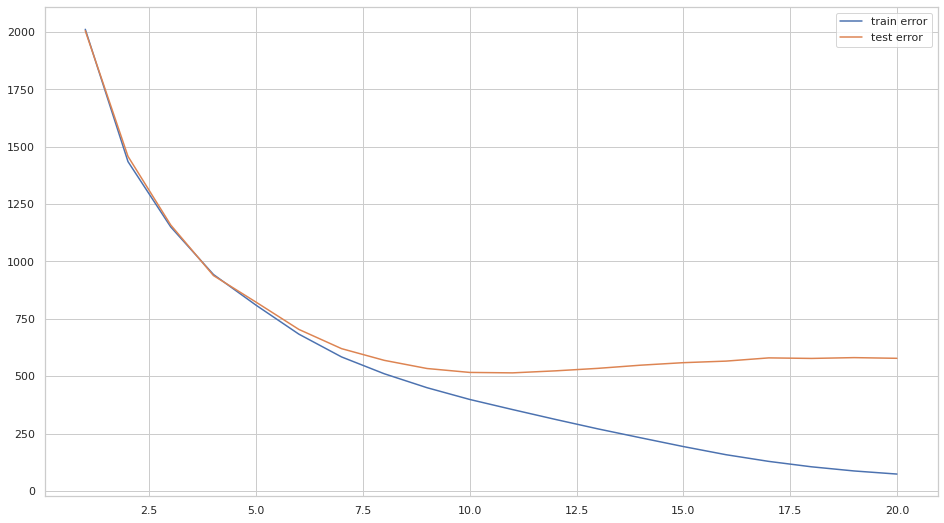

In [103]:
plt.plot(df.depth, df.train_error, label="train error")
plt.plot(df.depth, df.test_error, label="test error")
plt.legend();